**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings


In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints"
log_dir = "D:/F25-156/ResNet 3D/Federated_ResNet3D_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/ResNet 3D/Federated_ResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet 3D/Federated_ResNet3D_logs


ERROR: Could not find `tensorboard`. Please ensure that your PATH
contains an executable `tensorboard` program, or explicitly specify
the path to a TensorBoard binary by setting the `TENSORBOARD_BINARY`
environment variable.

**MONAI Preprocessing Transforms**

In [6]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [7]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [8]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 13 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


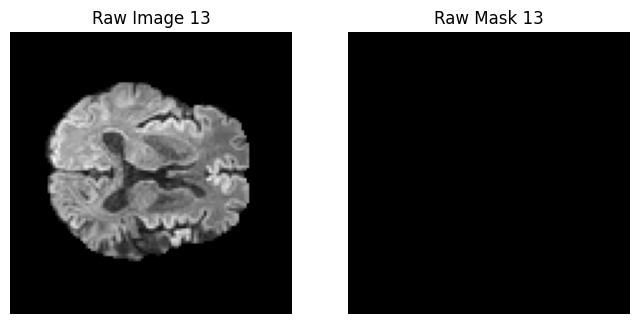

Sample 46 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


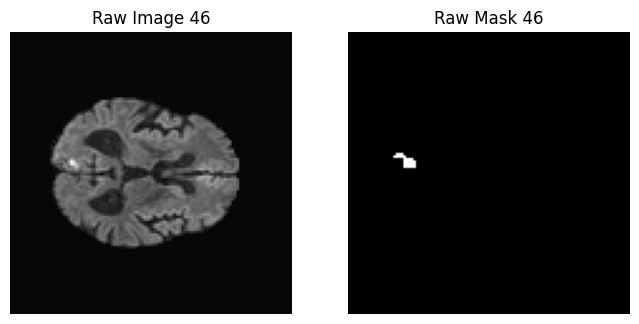

Client 0 - Preprocessed Samples:
Sample 13 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


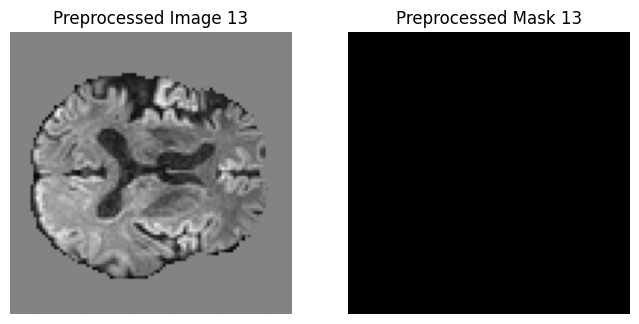

Sample 46 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


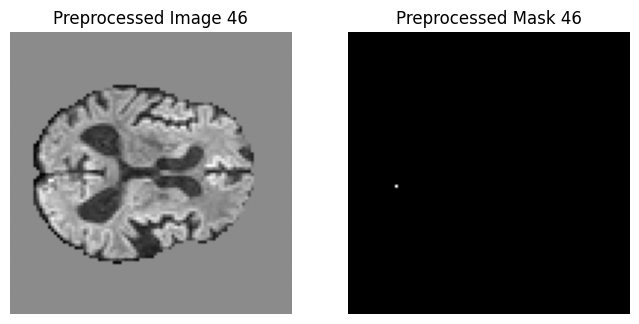

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 40 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


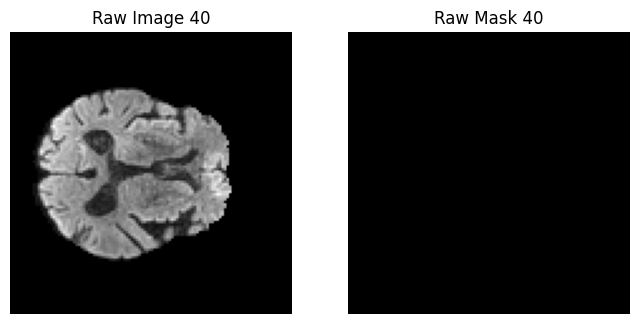

Sample 41 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


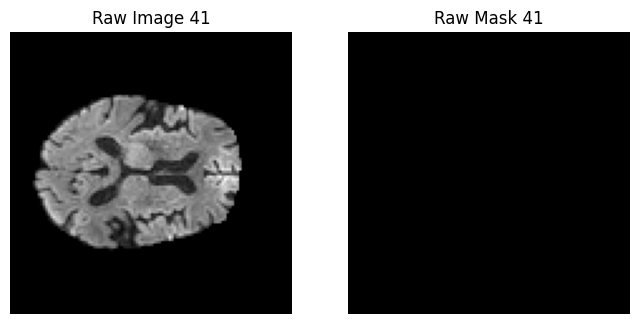

Client 1 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


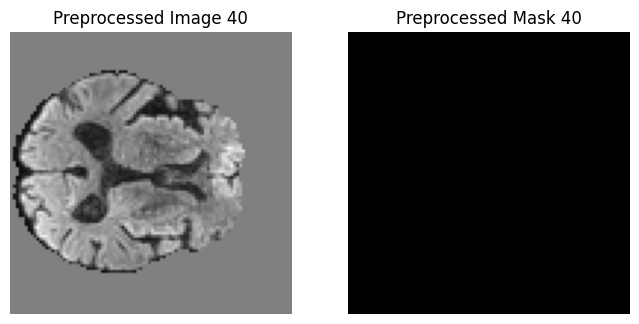

Sample 41 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


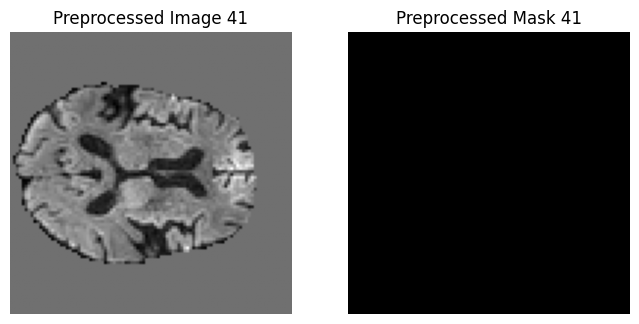

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 26 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


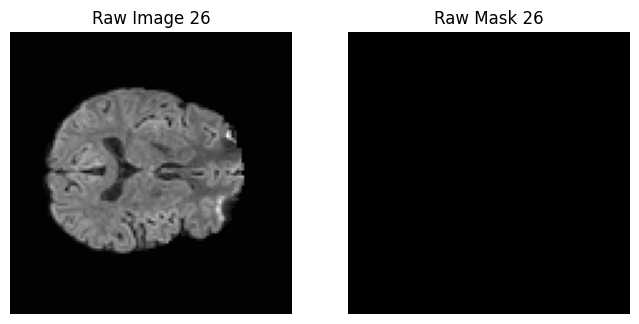

Sample 25 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


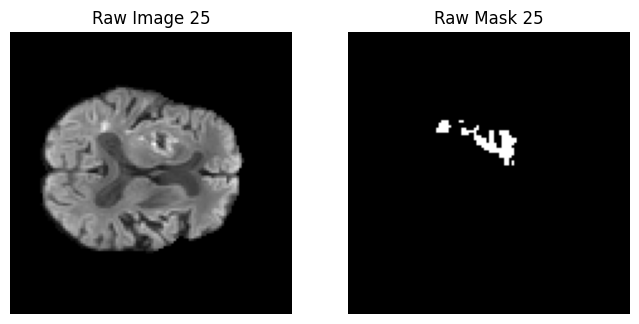

Client 2 - Preprocessed Samples:
Sample 26 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


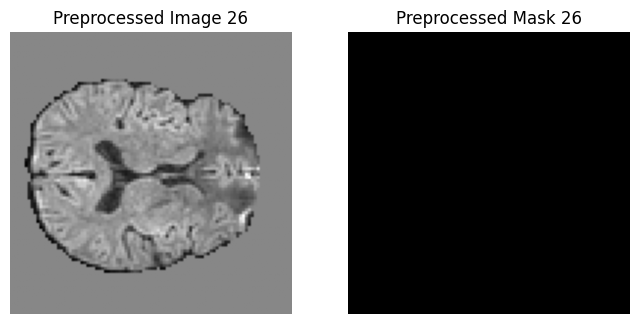

Sample 25 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


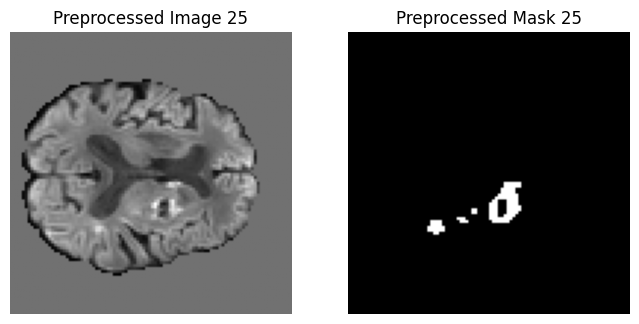

Client 2 samples: 50


In [9]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample["mask"])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [10]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [11]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    )
    print(model)
    return model

**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Using device: cpu
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8

**Federated Training loop**

In [ ]:
communication_rounds = 50  # upper bound
local_epochs = 5
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 5   # stop if Dice does not improve for 5 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6637 | Dice: 0.1615 | IoU: 0.0878 | HD95: 37.2982


Client 0 | Epoch 2/5 | Loss: 0.6436 | Dice: 0.2065 | IoU: 0.1151 | HD95: 34.1893


Client 0 | Epoch 3/5 | Loss: 0.6348 | Dice: 0.2097 | IoU: 0.1171 | HD95: 34.4849


Client 0 | Epoch 4/5 | Loss: 0.6279 | Dice: 0.2299 | IoU: 0.1299 | HD95: 33.8898


Clients Training:  33%|███▎      | 1/3 [07:09<14:18, 429.47s/it]

Client 0 | Epoch 5/5 | Loss: 0.6223 | Dice: 0.2347 | IoU: 0.1330 | HD95: 34.4119
Client 0 | Loss=0.6385 | Dice=0.2347 | IoU=0.1330 | HD95=34.4119


Client 1 | Epoch 1/5 | Loss: 0.6634 | Dice: 0.1759 | IoU: 0.0965 | HD95: 34.9313


Client 1 | Epoch 2/5 | Loss: 0.6429 | Dice: 0.2216 | IoU: 0.1246 | HD95: 33.6391


Client 1 | Epoch 3/5 | Loss: 0.6346 | Dice: 0.2349 | IoU: 0.1331 | HD95: 33.5045


Client 1 | Epoch 4/5 | Loss: 0.6277 | Dice: 0.2568 | IoU: 0.1473 | HD95: 33.5267


Clients Training:  67%|██████▋   | 2/3 [15:05<07:37, 457.15s/it]

Client 1 | Epoch 5/5 | Loss: 0.6212 | Dice: 0.2596 | IoU: 0.1492 | HD95: 33.1590
Client 1 | Loss=0.6380 | Dice=0.2596 | IoU=0.1492 | HD95=33.1590


Client 2 | Epoch 1/5 | Loss: 0.6623 | Dice: 0.1758 | IoU: 0.0964 | HD95: 37.8976


Client 2 | Epoch 2/5 | Loss: 0.6399 | Dice: 0.2802 | IoU: 0.1629 | HD95: 35.2277


Client 2 | Epoch 3/5 | Loss: 0.6327 | Dice: 0.2858 | IoU: 0.1667 | HD95: 34.8803


Client 2 | Epoch 4/5 | Loss: 0.6250 | Dice: 0.3013 | IoU: 0.1774 | HD95: 34.7724


Client 2 Epochs: 100%|██████████| 5/5 [07:56<00:00, 95.27s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.6179 | Dice: 0.3175 | IoU: 0.1887 | HD95: 34.7089
Client 2 | Loss=0.6356 | Dice=0.3175 | IoU=0.1887 | HD95=34.7089


Best global model updated with Dice=0.2033
Global | Val Loss=0.7696 | Dice=0.2033 | IoU=0.1131 | HD95=39.1682
Checkpoint saved for round 1 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6159 | Dice: 0.2509 | IoU: 0.1434 | HD95: 35.1870


Client 0 | Epoch 2/5 | Loss: 0.6098 | Dice: 0.2537 | IoU: 0.1453 | HD95: 34.4255


Client 0 | Epoch 3/5 | Loss: 0.6045 | Dice: 0.2672 | IoU: 0.1542 | HD95: 33.9490


Client 0 | Epoch 4/5 | Loss: 0.5983 | Dice: 0.2693 | IoU: 0.1556 | HD95: 34.1143


Clients Training:  33%|███▎      | 1/3 [07:45<15:31, 465.95s/it]

Client 0 | Epoch 5/5 | Loss: 0.5925 | Dice: 0.3019 | IoU: 0.1778 | HD95: 33.1821
Client 0 | Loss=0.6042 | Dice=0.3019 | IoU=0.1778 | HD95=33.1821


Client 1 | Epoch 1/5 | Loss: 0.6157 | Dice: 0.2714 | IoU: 0.1570 | HD95: 32.8994


Client 1 | Epoch 2/5 | Loss: 0.6092 | Dice: 0.2979 | IoU: 0.1750 | HD95: 32.4696


Client 1 | Epoch 3/5 | Loss: 0.6035 | Dice: 0.2990 | IoU: 0.1758 | HD95: 31.2954


Client 1 | Epoch 4/5 | Loss: 0.5983 | Dice: 0.3057 | IoU: 0.1805 | HD95: 32.0513


Clients Training:  67%|██████▋   | 2/3 [15:50<07:56, 476.74s/it]

Client 1 | Epoch 5/5 | Loss: 0.5926 | Dice: 0.3104 | IoU: 0.1837 | HD95: 31.2156
Client 1 | Loss=0.6038 | Dice=0.3104 | IoU=0.1837 | HD95=31.2156


Client 2 | Epoch 1/5 | Loss: 0.6129 | Dice: 0.3328 | IoU: 0.1996 | HD95: 34.7263


Client 2 | Epoch 2/5 | Loss: 0.6067 | Dice: 0.3382 | IoU: 0.2035 | HD95: 33.6143


Client 2 | Epoch 3/5 | Loss: 0.6000 | Dice: 0.3432 | IoU: 0.2071 | HD95: 33.2172


Client 2 | Epoch 4/5 | Loss: 0.5937 | Dice: 0.3796 | IoU: 0.2343 | HD95: 31.4874


Client 2 Epochs: 100%|██████████| 5/5 [08:14<00:00, 98.97s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5877 | Dice: 0.3919 | IoU: 0.2437 | HD95: 31.5299
Client 2 | Loss=0.6002 | Dice=0.3919 | IoU=0.2437 | HD95=31.5299


Best global model updated with Dice=0.2308
Global | Val Loss=0.7519 | Dice=0.2308 | IoU=0.1304 | HD95=35.6648
Checkpoint saved for round 2 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5857 | Dice: 0.3133 | IoU: 0.1857 | HD95: 32.1811


Client 0 | Epoch 2/5 | Loss: 0.5805 | Dice: 0.3343 | IoU: 0.2007 | HD95: 31.4700


Client 0 | Epoch 3/5 | Loss: 0.5757 | Dice: 0.3211 | IoU: 0.1913 | HD95: 30.2074


Client 0 | Epoch 4/5 | Loss: 0.5720 | Dice: 0.3371 | IoU: 0.2027 | HD95: 32.0895


Clients Training:  33%|███▎      | 1/3 [08:22<16:45, 502.93s/it]

Client 0 | Epoch 5/5 | Loss: 0.5678 | Dice: 0.3183 | IoU: 0.1893 | HD95: 31.3373
Client 0 | Loss=0.5763 | Dice=0.3183 | IoU=0.1893 | HD95=31.3373


Client 1 | Epoch 1/5 | Loss: 0.5868 | Dice: 0.3327 | IoU: 0.1995 | HD95: 30.3761


Client 1 | Epoch 2/5 | Loss: 0.5810 | Dice: 0.3600 | IoU: 0.2195 | HD95: 29.6073


Client 1 | Epoch 3/5 | Loss: 0.5773 | Dice: 0.3330 | IoU: 0.1998 | HD95: 31.1549


Client 1 | Epoch 4/5 | Loss: 0.5723 | Dice: 0.3565 | IoU: 0.2169 | HD95: 28.8538


Clients Training:  67%|██████▋   | 2/3 [16:17<08:06, 486.28s/it]

Client 1 | Epoch 5/5 | Loss: 0.5671 | Dice: 0.3609 | IoU: 0.2202 | HD95: 26.7362
Client 1 | Loss=0.5769 | Dice=0.3609 | IoU=0.2202 | HD95=26.7362


Client 2 | Epoch 1/5 | Loss: 0.5834 | Dice: 0.3629 | IoU: 0.2217 | HD95: 32.3673


Client 2 | Epoch 2/5 | Loss: 0.5770 | Dice: 0.3932 | IoU: 0.2447 | HD95: 30.5022


Client 2 | Epoch 3/5 | Loss: 0.5710 | Dice: 0.4188 | IoU: 0.2649 | HD95: 28.4780


Client 2 | Epoch 4/5 | Loss: 0.5660 | Dice: 0.4282 | IoU: 0.2725 | HD95: 28.9904


Client 2 Epochs: 100%|██████████| 5/5 [07:57<00:00, 95.41s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5612 | Dice: 0.4323 | IoU: 0.2757 | HD95: 29.3719
Client 2 | Loss=0.5717 | Dice=0.4323 | IoU=0.2757 | HD95=29.3719


Best global model updated with Dice=0.3001
Global | Val Loss=0.7361 | Dice=0.3001 | IoU=0.1766 | HD95=32.1271
Checkpoint saved for round 3 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5618 | Dice: 0.3485 | IoU: 0.2110 | HD95: 27.9227


Client 0 | Epoch 2/5 | Loss: 0.5578 | Dice: 0.3549 | IoU: 0.2158 | HD95: 30.7781


Client 0 | Epoch 3/5 | Loss: 0.5549 | Dice: 0.3311 | IoU: 0.1984 | HD95: 29.8639


Client 0 | Epoch 4/5 | Loss: 0.5487 | Dice: 0.3801 | IoU: 0.2346 | HD95: 29.2971


Clients Training:  33%|███▎      | 1/3 [07:57<15:55, 477.74s/it]

Client 0 | Epoch 5/5 | Loss: 0.5464 | Dice: 0.3687 | IoU: 0.2260 | HD95: 28.7361
Client 0 | Loss=0.5539 | Dice=0.3687 | IoU=0.2260 | HD95=28.7361


Client 1 | Epoch 1/5 | Loss: 0.5621 | Dice: 0.3759 | IoU: 0.2315 | HD95: 27.6470


Client 1 | Epoch 2/5 | Loss: 0.5582 | Dice: 0.3721 | IoU: 0.2286 | HD95: 26.9909


Client 1 | Epoch 3/5 | Loss: 0.5536 | Dice: 0.3976 | IoU: 0.2481 | HD95: 25.6285


Client 1 | Epoch 4/5 | Loss: 0.5512 | Dice: 0.3949 | IoU: 0.2460 | HD95: 25.4787


Clients Training:  67%|██████▋   | 2/3 [15:59<08:00, 480.11s/it]

Client 1 | Epoch 5/5 | Loss: 0.5471 | Dice: 0.3809 | IoU: 0.2353 | HD95: 27.2628
Client 1 | Loss=0.5544 | Dice=0.3809 | IoU=0.2353 | HD95=27.2628


Client 2 | Epoch 1/5 | Loss: 0.5572 | Dice: 0.4063 | IoU: 0.2549 | HD95: 26.8188


Client 2 | Epoch 2/5 | Loss: 0.5536 | Dice: 0.4330 | IoU: 0.2764 | HD95: 27.0172


Client 2 | Epoch 3/5 | Loss: 0.5488 | Dice: 0.4201 | IoU: 0.2659 | HD95: 28.1486


Client 2 | Epoch 4/5 | Loss: 0.5431 | Dice: 0.4496 | IoU: 0.2900 | HD95: 26.3748


Client 2 Epochs: 100%|██████████| 5/5 [08:06<00:00, 97.33s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5400 | Dice: 0.4333 | IoU: 0.2766 | HD95: 27.7131
Client 2 | Loss=0.5485 | Dice=0.4333 | IoU=0.2766 | HD95=27.7131


Best global model updated with Dice=0.3173
Global | Val Loss=0.7233 | Dice=0.3173 | IoU=0.1885 | HD95=30.3174
Checkpoint saved for round 4 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5410 | Dice: 0.3753 | IoU: 0.2310 | HD95: 27.3482


Client 0 | Epoch 2/5 | Loss: 0.5369 | Dice: 0.3959 | IoU: 0.2468 | HD95: 26.6215


Client 0 | Epoch 3/5 | Loss: 0.5334 | Dice: 0.3927 | IoU: 0.2443 | HD95: 26.9220


Client 0 | Epoch 4/5 | Loss: 0.5295 | Dice: 0.4304 | IoU: 0.2742 | HD95: 26.5314


Clients Training:  33%|███▎      | 1/3 [08:09<16:19, 489.97s/it]

Client 0 | Epoch 5/5 | Loss: 0.5284 | Dice: 0.3692 | IoU: 0.2264 | HD95: 29.5628
Client 0 | Loss=0.5338 | Dice=0.3692 | IoU=0.2264 | HD95=29.5628


Client 1 | Epoch 1/5 | Loss: 0.5418 | Dice: 0.4111 | IoU: 0.2587 | HD95: 25.9501


Client 1 | Epoch 2/5 | Loss: 0.5385 | Dice: 0.4027 | IoU: 0.2521 | HD95: 27.0403


Client 1 | Epoch 3/5 | Loss: 0.5348 | Dice: 0.3933 | IoU: 0.2448 | HD95: 24.9575


Client 1 | Epoch 4/5 | Loss: 0.5306 | Dice: 0.4252 | IoU: 0.2700 | HD95: 23.6488


Clients Training:  67%|██████▋   | 2/3 [16:23<08:12, 492.02s/it]

Client 1 | Epoch 5/5 | Loss: 0.5274 | Dice: 0.4436 | IoU: 0.2850 | HD95: 24.0557
Client 1 | Loss=0.5346 | Dice=0.4436 | IoU=0.2850 | HD95=24.0557


Client 2 | Epoch 1/5 | Loss: 0.5360 | Dice: 0.4370 | IoU: 0.2796 | HD95: 26.5843


Client 2 | Epoch 2/5 | Loss: 0.5308 | Dice: 0.4668 | IoU: 0.3044 | HD95: 22.7520


Client 2 | Epoch 3/5 | Loss: 0.5264 | Dice: 0.4851 | IoU: 0.3202 | HD95: 23.2968


Client 2 | Epoch 4/5 | Loss: 0.5226 | Dice: 0.4830 | IoU: 0.3184 | HD95: 22.8289


Client 2 Epochs: 100%|██████████| 5/5 [07:55<00:00, 95.09s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5198 | Dice: 0.4710 | IoU: 0.3080 | HD95: 24.7062
Client 2 | Loss=0.5271 | Dice=0.4710 | IoU=0.3080 | HD95=24.7062


Global | Val Loss=0.7116 | Dice=0.3135 | IoU=0.1859 | HD95=30.7520
Checkpoint saved for round 5 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5227 | Dice: 0.4100 | IoU: 0.2579 | HD95: 27.6411


Client 0 | Epoch 2/5 | Loss: 0.5217 | Dice: 0.4146 | IoU: 0.2615 | HD95: 25.3289


Client 0 | Epoch 3/5 | Loss: 0.5202 | Dice: 0.3449 | IoU: 0.2084 | HD95: 29.3670


Client 0 | Epoch 4/5 | Loss: 0.5134 | Dice: 0.4245 | IoU: 0.2694 | HD95: 25.6597


Clients Training:  33%|███▎      | 1/3 [08:00<16:00, 480.48s/it]

Client 0 | Epoch 5/5 | Loss: 0.5121 | Dice: 0.4095 | IoU: 0.2574 | HD95: 27.1233
Client 0 | Loss=0.5180 | Dice=0.4095 | IoU=0.2574 | HD95=27.1233


Client 1 | Epoch 1/5 | Loss: 0.5238 | Dice: 0.4338 | IoU: 0.2770 | HD95: 22.3102


Client 1 | Epoch 2/5 | Loss: 0.5205 | Dice: 0.4408 | IoU: 0.2827 | HD95: 23.3960


Client 1 | Epoch 3/5 | Loss: 0.5179 | Dice: 0.4475 | IoU: 0.2882 | HD95: 24.5376


Client 1 | Epoch 4/5 | Loss: 0.5141 | Dice: 0.4371 | IoU: 0.2796 | HD95: 23.5068


Clients Training:  67%|██████▋   | 2/3 [15:55<07:57, 477.26s/it]

Client 1 | Epoch 5/5 | Loss: 0.5106 | Dice: 0.4508 | IoU: 0.2910 | HD95: 22.0366
Client 1 | Loss=0.5174 | Dice=0.4508 | IoU=0.2910 | HD95=22.0366


Client 2 | Epoch 1/5 | Loss: 0.5165 | Dice: 0.4785 | IoU: 0.3145 | HD95: 24.4956


Client 2 | Epoch 2/5 | Loss: 0.5128 | Dice: 0.4738 | IoU: 0.3105 | HD95: 21.7145


Client 2 | Epoch 3/5 | Loss: 0.5087 | Dice: 0.4918 | IoU: 0.3261 | HD95: 20.6959


Client 2 | Epoch 4/5 | Loss: 0.5043 | Dice: 0.5144 | IoU: 0.3463 | HD95: 19.7550


Client 2 Epochs: 100%|██████████| 5/5 [07:59<00:00, 95.88s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.5002 | Dice: 0.5247 | IoU: 0.3556 | HD95: 20.6733
Client 2 | Loss=0.5085 | Dice=0.5247 | IoU=0.3556 | HD95=20.6733


Best global model updated with Dice=0.3823
Global | Val Loss=0.7003 | Dice=0.3823 | IoU=0.2363 | HD95=26.1460
Checkpoint saved for round 6 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5085 | Dice: 0.4437 | IoU: 0.2851 | HD95: 26.2891


Client 0 | Epoch 2/5 | Loss: 0.5077 | Dice: 0.3926 | IoU: 0.2442 | HD95: 29.8891


Client 0 | Epoch 3/5 | Loss: 0.5021 | Dice: 0.3995 | IoU: 0.2496 | HD95: 26.5978


Client 0 | Epoch 4/5 | Loss: 0.4975 | Dice: 0.4497 | IoU: 0.2901 | HD95: 25.4038


Clients Training:  33%|███▎      | 1/3 [08:05<16:10, 485.34s/it]

Client 0 | Epoch 5/5 | Loss: 0.4940 | Dice: 0.4743 | IoU: 0.3109 | HD95: 23.0926
Client 0 | Loss=0.5020 | Dice=0.4743 | IoU=0.3109 | HD95=23.0926


Client 1 | Epoch 1/5 | Loss: 0.5078 | Dice: 0.4470 | IoU: 0.2878 | HD95: 22.9037


Client 1 | Epoch 2/5 | Loss: 0.5045 | Dice: 0.4438 | IoU: 0.2851 | HD95: 21.1032


Client 1 | Epoch 3/5 | Loss: 0.5014 | Dice: 0.4592 | IoU: 0.2980 | HD95: 22.9498


Client 1 | Epoch 4/5 | Loss: 0.4987 | Dice: 0.4411 | IoU: 0.2830 | HD95: 22.3197


Clients Training:  67%|██████▋   | 2/3 [16:12<08:06, 486.35s/it]

Client 1 | Epoch 5/5 | Loss: 0.4971 | Dice: 0.4452 | IoU: 0.2863 | HD95: 24.7143
Client 1 | Loss=0.5019 | Dice=0.4452 | IoU=0.2863 | HD95=24.7143


Client 2 | Epoch 1/5 | Loss: 0.4980 | Dice: 0.5110 | IoU: 0.3432 | HD95: 21.6686


Client 2 | Epoch 2/5 | Loss: 0.4985 | Dice: 0.4572 | IoU: 0.2963 | HD95: 23.9985


Client 2 | Epoch 3/5 | Loss: 0.4949 | Dice: 0.4475 | IoU: 0.2882 | HD95: 24.6294


Client 2 | Epoch 4/5 | Loss: 0.4914 | Dice: 0.4444 | IoU: 0.2857 | HD95: 29.8957


Client 2 Epochs: 100%|██████████| 5/5 [08:08<00:00, 97.79s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4845 | Dice: 0.4990 | IoU: 0.3325 | HD95: 23.4253
Client 2 | Loss=0.4934 | Dice=0.4990 | IoU=0.3325 | HD95=23.4253


Best global model updated with Dice=0.4372
Global | Val Loss=0.6891 | Dice=0.4372 | IoU=0.2798 | HD95=22.8164
Checkpoint saved for round 7 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4921 | Dice: 0.4435 | IoU: 0.2850 | HD95: 24.3049


Client 0 | Epoch 2/5 | Loss: 0.4906 | Dice: 0.4243 | IoU: 0.2693 | HD95: 26.8135


Client 0 | Epoch 3/5 | Loss: 0.4858 | Dice: 0.4607 | IoU: 0.2993 | HD95: 24.9025


Client 0 | Epoch 4/5 | Loss: 0.4807 | Dice: 0.5098 | IoU: 0.3421 | HD95: 20.6729


Clients Training:  33%|███▎      | 1/3 [07:56<15:52, 476.05s/it]

Client 0 | Epoch 5/5 | Loss: 0.4788 | Dice: 0.4855 | IoU: 0.3206 | HD95: 23.5859
Client 0 | Loss=0.4856 | Dice=0.4855 | IoU=0.3206 | HD95=23.5859


Client 1 | Epoch 1/5 | Loss: 0.4923 | Dice: 0.4483 | IoU: 0.2889 | HD95: 21.4796


Client 1 | Epoch 2/5 | Loss: 0.4907 | Dice: 0.4394 | IoU: 0.2815 | HD95: 24.0325


Client 1 | Epoch 3/5 | Loss: 0.4861 | Dice: 0.4706 | IoU: 0.3077 | HD95: 22.1217


Client 1 | Epoch 4/5 | Loss: 0.4823 | Dice: 0.4640 | IoU: 0.3021 | HD95: 21.4663


Clients Training:  67%|██████▋   | 2/3 [15:51<07:55, 475.94s/it]

Client 1 | Epoch 5/5 | Loss: 0.4786 | Dice: 0.5022 | IoU: 0.3353 | HD95: 21.8161
Client 1 | Loss=0.4860 | Dice=0.5022 | IoU=0.3353 | HD95=21.8161


Client 2 | Epoch 1/5 | Loss: 0.4810 | Dice: 0.5084 | IoU: 0.3408 | HD95: 21.9628


Client 2 | Epoch 2/5 | Loss: 0.4771 | Dice: 0.5349 | IoU: 0.3651 | HD95: 19.5577


Client 2 | Epoch 3/5 | Loss: 0.4733 | Dice: 0.5392 | IoU: 0.3691 | HD95: 19.5321


Client 2 | Epoch 4/5 | Loss: 0.4688 | Dice: 0.5621 | IoU: 0.3910 | HD95: 19.5571


Client 2 Epochs: 100%|██████████| 5/5 [07:54<00:00, 94.93s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4651 | Dice: 0.5561 | IoU: 0.3852 | HD95: 19.9219
Client 2 | Loss=0.4730 | Dice=0.5561 | IoU=0.3852 | HD95=19.9219


Best global model updated with Dice=0.4407
Global | Val Loss=0.6778 | Dice=0.4407 | IoU=0.2827 | HD95=25.5771
Checkpoint saved for round 8 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4763 | Dice: 0.5029 | IoU: 0.3359 | HD95: 21.6151


Client 0 | Epoch 2/5 | Loss: 0.4763 | Dice: 0.4332 | IoU: 0.2765 | HD95: 26.3958


Client 0 | Epoch 3/5 | Loss: 0.4688 | Dice: 0.5082 | IoU: 0.3406 | HD95: 24.4135


Client 0 | Epoch 4/5 | Loss: 0.4664 | Dice: 0.4958 | IoU: 0.3296 | HD95: 20.2574


Clients Training:  33%|███▎      | 1/3 [08:02<16:05, 482.79s/it]

Client 0 | Epoch 5/5 | Loss: 0.4618 | Dice: 0.5340 | IoU: 0.3642 | HD95: 20.2756
Client 0 | Loss=0.4699 | Dice=0.5340 | IoU=0.3642 | HD95=20.2756


Client 1 | Epoch 1/5 | Loss: 0.4840 | Dice: 0.3769 | IoU: 0.2322 | HD95: 27.5608


Client 1 | Epoch 2/5 | Loss: 0.4758 | Dice: 0.4360 | IoU: 0.2787 | HD95: 25.1165


Client 1 | Epoch 3/5 | Loss: 0.4729 | Dice: 0.4396 | IoU: 0.2817 | HD95: 25.3347


Client 1 | Epoch 4/5 | Loss: 0.4694 | Dice: 0.4725 | IoU: 0.3093 | HD95: 24.0870


Clients Training:  67%|██████▋   | 2/3 [16:10<08:05, 485.79s/it]

Client 1 | Epoch 5/5 | Loss: 0.4631 | Dice: 0.4862 | IoU: 0.3212 | HD95: 19.6378
Client 1 | Loss=0.4730 | Dice=0.4862 | IoU=0.3212 | HD95=19.6378


Client 2 | Epoch 1/5 | Loss: 0.4627 | Dice: 0.5375 | IoU: 0.3675 | HD95: 19.2966


Client 2 | Epoch 2/5 | Loss: 0.4590 | Dice: 0.5450 | IoU: 0.3746 | HD95: 20.8471


Client 2 | Epoch 3/5 | Loss: 0.4544 | Dice: 0.5767 | IoU: 0.4052 | HD95: 17.1523


Client 2 | Epoch 4/5 | Loss: 0.4506 | Dice: 0.5788 | IoU: 0.4073 | HD95: 20.3206


Client 2 Epochs: 100%|██████████| 5/5 [08:13<00:00, 98.64s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4460 | Dice: 0.5830 | IoU: 0.4114 | HD95: 16.2048
Client 2 | Loss=0.4546 | Dice=0.5830 | IoU=0.4114 | HD95=16.2048


Global | Val Loss=0.6643 | Dice=0.3853 | IoU=0.2387 | HD95=25.4266
Checkpoint saved for round 9 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4631 | Dice: 0.4615 | IoU: 0.3000 | HD95: 23.5481


Client 0 | Epoch 2/5 | Loss: 0.4578 | Dice: 0.4842 | IoU: 0.3194 | HD95: 24.2669


Client 0 | Epoch 3/5 | Loss: 0.4521 | Dice: 0.5394 | IoU: 0.3693 | HD95: 20.5835


Client 0 | Epoch 4/5 | Loss: 0.4482 | Dice: 0.5688 | IoU: 0.3975 | HD95: 20.4277


Clients Training:  33%|███▎      | 1/3 [08:11<16:22, 491.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.4438 | Dice: 0.5872 | IoU: 0.4157 | HD95: 17.3380
Client 0 | Loss=0.4530 | Dice=0.5872 | IoU=0.4157 | HD95=17.3380


Client 1 | Epoch 1/5 | Loss: 0.4590 | Dice: 0.4970 | IoU: 0.3306 | HD95: 19.8590


Client 1 | Epoch 2/5 | Loss: 0.4550 | Dice: 0.5059 | IoU: 0.3386 | HD95: 19.8803


Client 1 | Epoch 3/5 | Loss: 0.4513 | Dice: 0.4925 | IoU: 0.3267 | HD95: 22.5155


Client 1 | Epoch 4/5 | Loss: 0.4473 | Dice: 0.5288 | IoU: 0.3594 | HD95: 20.0250


Clients Training:  67%|██████▋   | 2/3 [16:20<08:10, 490.21s/it]

Client 1 | Epoch 5/5 | Loss: 0.4449 | Dice: 0.4966 | IoU: 0.3303 | HD95: 19.8245
Client 1 | Loss=0.4515 | Dice=0.4966 | IoU=0.3303 | HD95=19.8245


Client 2 | Epoch 1/5 | Loss: 0.4443 | Dice: 0.5662 | IoU: 0.3949 | HD95: 20.4129


Client 2 | Epoch 2/5 | Loss: 0.4394 | Dice: 0.5674 | IoU: 0.3961 | HD95: 17.1774


Client 2 | Epoch 3/5 | Loss: 0.4352 | Dice: 0.5686 | IoU: 0.3972 | HD95: 18.5411


Client 2 | Epoch 4/5 | Loss: 0.4306 | Dice: 0.6019 | IoU: 0.4306 | HD95: 14.9714


Client 2 Epochs: 100%|██████████| 5/5 [08:09<00:00, 97.83s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4263 | Dice: 0.6048 | IoU: 0.4335 | HD95: 18.9933
Client 2 | Loss=0.4352 | Dice=0.6048 | IoU=0.4335 | HD95=18.9933


Best global model updated with Dice=0.4646
Global | Val Loss=0.6476 | Dice=0.4646 | IoU=0.3026 | HD95=22.3864
Checkpoint saved for round 10 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round10.pth

--- Communication Round 11 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4427 | Dice: 0.5455 | IoU: 0.3750 | HD95: 19.5284


Client 0 | Epoch 2/5 | Loss: 0.4390 | Dice: 0.5392 | IoU: 0.3691 | HD95: 23.7356


Client 0 | Epoch 3/5 | Loss: 0.4335 | Dice: 0.5701 | IoU: 0.3987 | HD95: 19.9525


Client 0 | Epoch 4/5 | Loss: 0.4290 | Dice: 0.6018 | IoU: 0.4304 | HD95: 14.4900


Clients Training:  33%|███▎      | 1/3 [08:05<16:11, 485.93s/it]

Client 0 | Epoch 5/5 | Loss: 0.4258 | Dice: 0.5754 | IoU: 0.4039 | HD95: 16.2929
Client 0 | Loss=0.4340 | Dice=0.5754 | IoU=0.4039 | HD95=16.2929


Client 1 | Epoch 1/5 | Loss: 0.4403 | Dice: 0.5082 | IoU: 0.3407 | HD95: 22.3552


Client 1 | Epoch 2/5 | Loss: 0.4392 | Dice: 0.5061 | IoU: 0.3387 | HD95: 18.2833


Client 1 | Epoch 3/5 | Loss: 0.4370 | Dice: 0.4775 | IoU: 0.3136 | HD95: 22.7071


Client 1 | Epoch 4/5 | Loss: 0.4291 | Dice: 0.5062 | IoU: 0.3389 | HD95: 21.1684


Clients Training:  67%|██████▋   | 2/3 [16:18<08:09, 489.72s/it]

Client 1 | Epoch 5/5 | Loss: 0.4413 | Dice: 0.3800 | IoU: 0.2346 | HD95: 26.3922
Client 1 | Loss=0.4374 | Dice=0.3800 | IoU=0.2346 | HD95=26.3922


Client 2 | Epoch 1/5 | Loss: 0.4245 | Dice: 0.5640 | IoU: 0.3928 | HD95: 17.4160


Client 2 | Epoch 2/5 | Loss: 0.4186 | Dice: 0.5816 | IoU: 0.4100 | HD95: 17.4652


Client 2 | Epoch 3/5 | Loss: 0.4163 | Dice: 0.5552 | IoU: 0.3843 | HD95: 19.9296


Client 2 | Epoch 4/5 | Loss: 0.4097 | Dice: 0.5929 | IoU: 0.4214 | HD95: 16.5815


Client 2 Epochs: 100%|██████████| 5/5 [08:12<00:00, 98.42s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.4043 | Dice: 0.5791 | IoU: 0.4075 | HD95: 17.0238
Client 2 | Loss=0.4147 | Dice=0.5791 | IoU=0.4075 | HD95=17.0238


Global | Val Loss=0.6306 | Dice=0.4082 | IoU=0.2564 | HD95=26.3001
Checkpoint saved for round 11 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round11.pth

--- Communication Round 12 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4240 | Dice: 0.5300 | IoU: 0.3605 | HD95: 20.4817


Client 0 | Epoch 2/5 | Loss: 0.4216 | Dice: 0.5391 | IoU: 0.3690 | HD95: 22.9875


Client 0 | Epoch 3/5 | Loss: 0.4179 | Dice: 0.5357 | IoU: 0.3658 | HD95: 20.1848


Client 0 | Epoch 4/5 | Loss: 0.4109 | Dice: 0.5832 | IoU: 0.4117 | HD95: 18.8687


Clients Training:  33%|███▎      | 1/3 [08:11<16:22, 491.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.4045 | Dice: 0.6117 | IoU: 0.4406 | HD95: 19.2072
Client 0 | Loss=0.4158 | Dice=0.6117 | IoU=0.4406 | HD95=19.2072


Client 1 | Epoch 1/5 | Loss: 0.4209 | Dice: 0.5212 | IoU: 0.3524 | HD95: 19.2558


Client 1 | Epoch 2/5 | Loss: 0.4143 | Dice: 0.5551 | IoU: 0.3842 | HD95: 16.8543


Client 1 | Epoch 3/5 | Loss: 0.4084 | Dice: 0.5777 | IoU: 0.4062 | HD95: 15.5606


Client 1 | Epoch 4/5 | Loss: 0.4053 | Dice: 0.5550 | IoU: 0.3841 | HD95: 16.1511


Clients Training:  67%|██████▋   | 2/3 [16:22<08:11, 491.10s/it]

Client 1 | Epoch 5/5 | Loss: 0.3988 | Dice: 0.5990 | IoU: 0.4275 | HD95: 14.8307
Client 1 | Loss=0.4095 | Dice=0.5990 | IoU=0.4275 | HD95=14.8307


Client 2 | Epoch 1/5 | Loss: 0.4014 | Dice: 0.5841 | IoU: 0.4125 | HD95: 18.8967


Client 2 | Epoch 2/5 | Loss: 0.3962 | Dice: 0.5831 | IoU: 0.4116 | HD95: 16.5513


Client 2 | Epoch 3/5 | Loss: 0.3896 | Dice: 0.6186 | IoU: 0.4478 | HD95: 16.3709


Client 2 | Epoch 4/5 | Loss: 0.3825 | Dice: 0.6398 | IoU: 0.4703 | HD95: 12.9862


Client 2 Epochs: 100%|██████████| 5/5 [08:07<00:00, 97.50s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3808 | Dice: 0.5903 | IoU: 0.4188 | HD95: 17.0143
Client 2 | Loss=0.3901 | Dice=0.5903 | IoU=0.4188 | HD95=17.0143


Best global model updated with Dice=0.5362
Global | Val Loss=0.6048 | Dice=0.5362 | IoU=0.3663 | HD95=19.4129
Checkpoint saved for round 12 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round12.pth

--- Communication Round 13 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4025 | Dice: 0.5696 | IoU: 0.3982 | HD95: 20.1485


Client 0 | Epoch 2/5 | Loss: 0.3954 | Dice: 0.5935 | IoU: 0.4220 | HD95: 17.2489


Client 0 | Epoch 3/5 | Loss: 0.3883 | Dice: 0.6412 | IoU: 0.4719 | HD95: 13.7453


Client 0 | Epoch 4/5 | Loss: 0.3838 | Dice: 0.6278 | IoU: 0.4575 | HD95: 14.6184


Clients Training:  33%|███▎      | 1/3 [08:04<16:08, 484.11s/it]

Client 0 | Epoch 5/5 | Loss: 0.3791 | Dice: 0.6377 | IoU: 0.4681 | HD95: 13.8676
Client 0 | Loss=0.3898 | Dice=0.6377 | IoU=0.4681 | HD95=13.8676


Client 1 | Epoch 1/5 | Loss: 0.3966 | Dice: 0.5778 | IoU: 0.4063 | HD95: 17.4158


Client 1 | Epoch 2/5 | Loss: 0.4003 | Dice: 0.4991 | IoU: 0.3325 | HD95: 20.6528


Client 1 | Epoch 3/5 | Loss: 0.3875 | Dice: 0.5695 | IoU: 0.3981 | HD95: 16.1464


Client 1 | Epoch 4/5 | Loss: 0.3791 | Dice: 0.5949 | IoU: 0.4234 | HD95: 15.8134


Clients Training:  67%|██████▋   | 2/3 [16:10<08:05, 485.70s/it]

Client 1 | Epoch 5/5 | Loss: 0.3725 | Dice: 0.5938 | IoU: 0.4223 | HD95: 15.5907
Client 1 | Loss=0.3872 | Dice=0.5938 | IoU=0.4223 | HD95=15.5907


Client 2 | Epoch 1/5 | Loss: 0.3741 | Dice: 0.6212 | IoU: 0.4506 | HD95: 16.5668


Client 2 | Epoch 2/5 | Loss: 0.3679 | Dice: 0.6298 | IoU: 0.4596 | HD95: 14.8933


Client 2 | Epoch 3/5 | Loss: 0.3609 | Dice: 0.6388 | IoU: 0.4693 | HD95: 15.2304


Client 2 | Epoch 4/5 | Loss: 0.3545 | Dice: 0.6585 | IoU: 0.4908 | HD95: 14.3213


Client 2 Epochs: 100%|██████████| 5/5 [08:07<00:00, 97.48s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3498 | Dice: 0.6579 | IoU: 0.4902 | HD95: 11.6057
Client 2 | Loss=0.3615 | Dice=0.6579 | IoU=0.4902 | HD95=11.6057


Best global model updated with Dice=0.5695
Global | Val Loss=0.5746 | Dice=0.5695 | IoU=0.3981 | HD95=18.6352
Checkpoint saved for round 13 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round13.pth

--- Communication Round 14 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3749 | Dice: 0.6384 | IoU: 0.4688 | HD95: 14.9646


Client 0 | Epoch 2/5 | Loss: 0.3889 | Dice: 0.4754 | IoU: 0.3118 | HD95: 23.7775


Client 0 | Epoch 3/5 | Loss: 0.3753 | Dice: 0.5596 | IoU: 0.3885 | HD95: 20.8731


Client 0 | Epoch 4/5 | Loss: 0.3712 | Dice: 0.5579 | IoU: 0.3869 | HD95: 23.6963


Clients Training:  33%|███▎      | 1/3 [08:07<16:14, 487.15s/it]

Client 0 | Epoch 5/5 | Loss: 0.3601 | Dice: 0.6166 | IoU: 0.4458 | HD95: 17.4704
Client 0 | Loss=0.3741 | Dice=0.6166 | IoU=0.4458 | HD95=17.4704


Client 1 | Epoch 1/5 | Loss: 0.3698 | Dice: 0.5883 | IoU: 0.4167 | HD95: 14.6609


Client 1 | Epoch 2/5 | Loss: 0.3635 | Dice: 0.6016 | IoU: 0.4302 | HD95: 15.8493


Client 1 | Epoch 3/5 | Loss: 0.3578 | Dice: 0.6068 | IoU: 0.4355 | HD95: 13.6032


Client 1 | Epoch 4/5 | Loss: 0.3476 | Dice: 0.6465 | IoU: 0.4776 | HD95: 12.3052


Clients Training:  67%|██████▋   | 2/3 [16:15<08:07, 487.96s/it]

Client 1 | Epoch 5/5 | Loss: 0.3411 | Dice: 0.6494 | IoU: 0.4808 | HD95: 11.7618
Client 1 | Loss=0.3559 | Dice=0.6494 | IoU=0.4808 | HD95=11.7618


Client 2 | Epoch 1/5 | Loss: 0.3443 | Dice: 0.6492 | IoU: 0.4806 | HD95: 15.3562


Client 2 | Epoch 2/5 | Loss: 0.3378 | Dice: 0.6723 | IoU: 0.5064 | HD95: 15.4241


Client 2 | Epoch 3/5 | Loss: 0.3326 | Dice: 0.6642 | IoU: 0.4973 | HD95: 14.7390


Client 2 | Epoch 4/5 | Loss: 0.3283 | Dice: 0.6529 | IoU: 0.4847 | HD95: 15.2972


Client 2 Epochs: 100%|██████████| 5/5 [08:07<00:00, 97.43s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.3215 | Dice: 0.6581 | IoU: 0.4904 | HD95: 15.5061
Client 2 | Loss=0.3329 | Dice=0.6581 | IoU=0.4904 | HD95=15.5061


Best global model updated with Dice=0.6201
Global | Val Loss=0.5410 | Dice=0.6201 | IoU=0.4494 | HD95=15.0997
Checkpoint saved for round 14 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round14.pth

--- Communication Round 15 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3463 | Dice: 0.6801 | IoU: 0.5153 | HD95: 11.9912


Client 0 | Epoch 2/5 | Loss: 0.3390 | Dice: 0.6995 | IoU: 0.5378 | HD95: 10.7321


Client 0 | Epoch 3/5 | Loss: 0.3317 | Dice: 0.6977 | IoU: 0.5358 | HD95: 10.6269


Client 0 | Epoch 4/5 | Loss: 0.3254 | Dice: 0.7053 | IoU: 0.5447 | HD95: 10.1140


Clients Training:  33%|███▎      | 1/3 [08:02<16:04, 482.14s/it]

Client 0 | Epoch 5/5 | Loss: 0.3180 | Dice: 0.7146 | IoU: 0.5560 | HD95: 10.4225
Client 0 | Loss=0.3321 | Dice=0.7146 | IoU=0.5560 | HD95=10.4225


Client 1 | Epoch 1/5 | Loss: 0.3401 | Dice: 0.6210 | IoU: 0.4503 | HD95: 14.4276


Client 1 | Epoch 2/5 | Loss: 0.3373 | Dice: 0.6239 | IoU: 0.4534 | HD95: 14.2385


Client 1 | Epoch 3/5 | Loss: 0.3289 | Dice: 0.6232 | IoU: 0.4526 | HD95: 14.3534


Client 1 | Epoch 4/5 | Loss: 0.3221 | Dice: 0.6445 | IoU: 0.4754 | HD95: 13.1262


Clients Training:  67%|██████▋   | 2/3 [16:08<08:04, 484.64s/it]

Client 1 | Epoch 5/5 | Loss: 0.3093 | Dice: 0.6797 | IoU: 0.5148 | HD95: 10.9365
Client 1 | Loss=0.3275 | Dice=0.6797 | IoU=0.5148 | HD95=10.9365


Client 2 | Epoch 1/5 | Loss: 0.3161 | Dice: 0.6590 | IoU: 0.4914 | HD95: 13.6791


Client 2 | Epoch 2/5 | Loss: 0.3093 | Dice: 0.6573 | IoU: 0.4896 | HD95: 13.9380


Client 2 | Epoch 3/5 | Loss: 0.3028 | Dice: 0.6806 | IoU: 0.5159 | HD95: 11.2922


Client 2 | Epoch 4/5 | Loss: 0.2942 | Dice: 0.6975 | IoU: 0.5356 | HD95: 12.4225


Client 2 Epochs: 100%|██████████| 5/5 [08:00<00:00, 96.12s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2876 | Dice: 0.6991 | IoU: 0.5374 | HD95: 11.2969
Client 2 | Loss=0.3020 | Dice=0.6991 | IoU=0.5374 | HD95=11.2969


Global | Val Loss=0.4987 | Dice=0.5855 | IoU=0.4139 | HD95=19.1945
Checkpoint saved for round 15 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round15.pth

--- Communication Round 16 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3159 | Dice: 0.6960 | IoU: 0.5337 | HD95: 11.1859


Client 0 | Epoch 2/5 | Loss: 0.3083 | Dice: 0.7085 | IoU: 0.5486 | HD95: 11.2775


Client 0 | Epoch 3/5 | Loss: 0.3009 | Dice: 0.7361 | IoU: 0.5824 | HD95: 9.2028


Client 0 | Epoch 4/5 | Loss: 0.2938 | Dice: 0.7197 | IoU: 0.5622 | HD95: 9.4321


Clients Training:  33%|███▎      | 1/3 [08:01<16:03, 481.61s/it]

Client 0 | Epoch 5/5 | Loss: 0.2945 | Dice: 0.6933 | IoU: 0.5306 | HD95: 14.2544
Client 0 | Loss=0.3027 | Dice=0.6933 | IoU=0.5306 | HD95=14.2544


Client 1 | Epoch 1/5 | Loss: 0.3118 | Dice: 0.6460 | IoU: 0.4771 | HD95: 11.5380


Client 1 | Epoch 2/5 | Loss: 0.3043 | Dice: 0.6722 | IoU: 0.5062 | HD95: 12.3931


Client 1 | Epoch 3/5 | Loss: 0.2971 | Dice: 0.6690 | IoU: 0.5026 | HD95: 12.9585


Client 1 | Epoch 4/5 | Loss: 0.2876 | Dice: 0.6967 | IoU: 0.5345 | HD95: 11.6346


Clients Training:  67%|██████▋   | 2/3 [16:07<08:03, 483.86s/it]

Client 1 | Epoch 5/5 | Loss: 0.2771 | Dice: 0.7211 | IoU: 0.5639 | HD95: 11.0282
Client 1 | Loss=0.2956 | Dice=0.7211 | IoU=0.5639 | HD95=11.0282


Client 2 | Epoch 1/5 | Loss: 0.2851 | Dice: 0.6773 | IoU: 0.5121 | HD95: 13.0514


Client 2 | Epoch 2/5 | Loss: 0.2779 | Dice: 0.7091 | IoU: 0.5493 | HD95: 10.2752


Client 2 | Epoch 3/5 | Loss: 0.2736 | Dice: 0.6917 | IoU: 0.5287 | HD95: 12.0398


Client 2 | Epoch 4/5 | Loss: 0.2654 | Dice: 0.7142 | IoU: 0.5555 | HD95: 12.1389


Client 2 Epochs: 100%|██████████| 5/5 [08:07<00:00, 97.54s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2638 | Dice: 0.6858 | IoU: 0.5218 | HD95: 12.4011
Client 2 | Loss=0.2732 | Dice=0.6858 | IoU=0.5218 | HD95=12.4011


Best global model updated with Dice=0.6769
Global | Val Loss=0.4581 | Dice=0.6769 | IoU=0.5116 | HD95=13.5722
Checkpoint saved for round 16 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round16.pth

--- Communication Round 17 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2886 | Dice: 0.7108 | IoU: 0.5514 | HD95: 12.7727


Client 0 | Epoch 2/5 | Loss: 0.3041 | Dice: 0.6398 | IoU: 0.4704 | HD95: 14.8760


Client 0 | Epoch 3/5 | Loss: 0.2869 | Dice: 0.6855 | IoU: 0.5215 | HD95: 14.8256


Client 0 | Epoch 4/5 | Loss: 0.2801 | Dice: 0.6726 | IoU: 0.5067 | HD95: 15.2829


Clients Training:  33%|███▎      | 1/3 [08:05<16:11, 485.57s/it]

Client 0 | Epoch 5/5 | Loss: 0.2605 | Dice: 0.7468 | IoU: 0.5959 | HD95: 9.3795
Client 0 | Loss=0.2840 | Dice=0.7468 | IoU=0.5959 | HD95=9.3795


Client 1 | Epoch 1/5 | Loss: 0.2776 | Dice: 0.7036 | IoU: 0.5428 | HD95: 10.2525


Client 1 | Epoch 2/5 | Loss: 0.2770 | Dice: 0.6598 | IoU: 0.4923 | HD95: 12.1542


Client 1 | Epoch 3/5 | Loss: 0.2632 | Dice: 0.6985 | IoU: 0.5367 | HD95: 11.7375


Client 1 | Epoch 4/5 | Loss: 0.2630 | Dice: 0.6984 | IoU: 0.5366 | HD95: 11.4764


Clients Training:  67%|██████▋   | 2/3 [16:09<08:04, 484.84s/it]

Client 1 | Epoch 5/5 | Loss: 0.2618 | Dice: 0.6735 | IoU: 0.5077 | HD95: 11.3471
Client 1 | Loss=0.2685 | Dice=0.6735 | IoU=0.5077 | HD95=11.3471


Client 2 | Epoch 1/5 | Loss: 0.2530 | Dice: 0.7274 | IoU: 0.5716 | HD95: 10.4896


Client 2 | Epoch 2/5 | Loss: 0.2521 | Dice: 0.7063 | IoU: 0.5460 | HD95: 11.5698


Client 2 | Epoch 3/5 | Loss: 0.2447 | Dice: 0.7193 | IoU: 0.5617 | HD95: 10.5247


Client 2 | Epoch 4/5 | Loss: 0.2472 | Dice: 0.6978 | IoU: 0.5358 | HD95: 13.4361


Client 2 Epochs: 100%|██████████| 5/5 [08:02<00:00, 96.55s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2410 | Dice: 0.6931 | IoU: 0.5303 | HD95: 12.5643
Client 2 | Loss=0.2476 | Dice=0.6931 | IoU=0.5303 | HD95=12.5643


Global | Val Loss=0.4157 | Dice=0.6527 | IoU=0.4844 | HD95=16.3830
Checkpoint saved for round 17 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round17.pth

--- Communication Round 18 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2564 | Dice: 0.7533 | IoU: 0.6042 | HD95: 7.7948


Client 0 | Epoch 2/5 | Loss: 0.2465 | Dice: 0.7689 | IoU: 0.6245 | HD95: 6.7376


Client 0 | Epoch 3/5 | Loss: 0.2393 | Dice: 0.7724 | IoU: 0.6291 | HD95: 4.9960


Client 0 | Epoch 4/5 | Loss: 0.2358 | Dice: 0.7708 | IoU: 0.6271 | HD95: 7.3478


Clients Training:  33%|███▎      | 1/3 [07:59<15:59, 479.67s/it]

Client 0 | Epoch 5/5 | Loss: 0.2296 | Dice: 0.7828 | IoU: 0.6431 | HD95: 6.4052
Client 0 | Loss=0.2415 | Dice=0.7828 | IoU=0.6431 | HD95=6.4052


Client 1 | Epoch 1/5 | Loss: 0.2473 | Dice: 0.7252 | IoU: 0.5689 | HD95: 8.9283


Client 1 | Epoch 2/5 | Loss: 0.2495 | Dice: 0.7092 | IoU: 0.5494 | HD95: 9.7039


Client 1 | Epoch 3/5 | Loss: 0.2305 | Dice: 0.7445 | IoU: 0.5930 | HD95: 8.8528


Client 1 | Epoch 4/5 | Loss: 0.2232 | Dice: 0.7662 | IoU: 0.6210 | HD95: 6.6301


Clients Training:  67%|██████▋   | 2/3 [16:01<08:01, 481.09s/it]

Client 1 | Epoch 5/5 | Loss: 0.2206 | Dice: 0.7574 | IoU: 0.6096 | HD95: 6.5146
Client 1 | Loss=0.2342 | Dice=0.7574 | IoU=0.6096 | HD95=6.5146


Client 2 | Epoch 1/5 | Loss: 0.2296 | Dice: 0.7235 | IoU: 0.5668 | HD95: 11.2855


Client 2 | Epoch 2/5 | Loss: 0.2228 | Dice: 0.7406 | IoU: 0.5881 | HD95: 8.8095


Client 2 | Epoch 3/5 | Loss: 0.2188 | Dice: 0.7549 | IoU: 0.6063 | HD95: 9.4746


Client 2 | Epoch 4/5 | Loss: 0.2132 | Dice: 0.7516 | IoU: 0.6020 | HD95: 10.3704


Client 2 Epochs: 100%|██████████| 5/5 [08:01<00:00, 96.32s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.2122 | Dice: 0.7338 | IoU: 0.5796 | HD95: 9.5712
Client 2 | Loss=0.2193 | Dice=0.7338 | IoU=0.5796 | HD95=9.5712


Best global model updated with Dice=0.7000
Global | Val Loss=0.3735 | Dice=0.7000 | IoU=0.5384 | HD95=12.7564
Checkpoint saved for round 18 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round18.pth

--- Communication Round 19 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2247 | Dice: 0.7798 | IoU: 0.6390 | HD95: 6.7440


Client 0 | Epoch 2/5 | Loss: 0.2253 | Dice: 0.7651 | IoU: 0.6195 | HD95: 6.2273


Client 0 | Epoch 3/5 | Loss: 0.2197 | Dice: 0.7632 | IoU: 0.6171 | HD95: 7.3878


Client 0 | Epoch 4/5 | Loss: 0.2151 | Dice: 0.7634 | IoU: 0.6174 | HD95: 6.4390


Clients Training:  33%|███▎      | 1/3 [07:57<15:55, 477.97s/it]

Client 0 | Epoch 5/5 | Loss: 0.2108 | Dice: 0.7636 | IoU: 0.6176 | HD95: 8.3931
Client 0 | Loss=0.2191 | Dice=0.7636 | IoU=0.6176 | HD95=8.3931


Client 1 | Epoch 1/5 | Loss: 0.2138 | Dice: 0.7550 | IoU: 0.6064 | HD95: 9.0677


Client 1 | Epoch 2/5 | Loss: 0.2087 | Dice: 0.7685 | IoU: 0.6240 | HD95: 7.2755


Client 1 | Epoch 3/5 | Loss: 0.2042 | Dice: 0.7818 | IoU: 0.6417 | HD95: 9.2368


Client 1 | Epoch 4/5 | Loss: 0.1947 | Dice: 0.7827 | IoU: 0.6429 | HD95: 7.0104


Clients Training:  67%|██████▋   | 2/3 [16:01<08:01, 481.19s/it]

Client 1 | Epoch 5/5 | Loss: 0.1942 | Dice: 0.7677 | IoU: 0.6229 | HD95: 6.6767
Client 1 | Loss=0.2031 | Dice=0.7677 | IoU=0.6229 | HD95=6.6767


Client 2 | Epoch 1/5 | Loss: 0.2032 | Dice: 0.7646 | IoU: 0.6189 | HD95: 9.0980


Client 2 | Epoch 2/5 | Loss: 0.2038 | Dice: 0.7562 | IoU: 0.6080 | HD95: 9.7563


Client 2 | Epoch 3/5 | Loss: 0.1951 | Dice: 0.7664 | IoU: 0.6213 | HD95: 7.5942


Client 2 | Epoch 4/5 | Loss: 0.1926 | Dice: 0.7749 | IoU: 0.6326 | HD95: 8.3302


Client 2 Epochs: 100%|██████████| 5/5 [08:04<00:00, 96.83s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1878 | Dice: 0.7780 | IoU: 0.6366 | HD95: 6.7715
Client 2 | Loss=0.1965 | Dice=0.7780 | IoU=0.6366 | HD95=6.7715


Global | Val Loss=0.3413 | Dice=0.6924 | IoU=0.5295 | HD95=11.8299
Checkpoint saved for round 19 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round19.pth

--- Communication Round 20 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2062 | Dice: 0.7797 | IoU: 0.6390 | HD95: 6.3441


Client 0 | Epoch 2/5 | Loss: 0.2001 | Dice: 0.7861 | IoU: 0.6476 | HD95: 7.1950


Client 0 | Epoch 3/5 | Loss: 0.1962 | Dice: 0.7857 | IoU: 0.6470 | HD95: 7.0763


Client 0 | Epoch 4/5 | Loss: 0.1946 | Dice: 0.7717 | IoU: 0.6282 | HD95: 6.7304


Clients Training:  33%|███▎      | 1/3 [08:02<16:05, 482.66s/it]

Client 0 | Epoch 5/5 | Loss: 0.2097 | Dice: 0.7196 | IoU: 0.5620 | HD95: 11.6061
Client 0 | Loss=0.2014 | Dice=0.7196 | IoU=0.5620 | HD95=11.6061


Client 1 | Epoch 1/5 | Loss: 0.2227 | Dice: 0.6836 | IoU: 0.5193 | HD95: 12.3686


Client 1 | Epoch 2/5 | Loss: 0.2082 | Dice: 0.7142 | IoU: 0.5554 | HD95: 12.1882


Client 1 | Epoch 3/5 | Loss: 0.1917 | Dice: 0.7615 | IoU: 0.6149 | HD95: 8.2744


Client 1 | Epoch 4/5 | Loss: 0.1843 | Dice: 0.7719 | IoU: 0.6285 | HD95: 5.8785


Clients Training:  67%|██████▋   | 2/3 [16:07<08:03, 483.79s/it]

Client 1 | Epoch 5/5 | Loss: 0.1724 | Dice: 0.7970 | IoU: 0.6625 | HD95: 5.4728
Client 1 | Loss=0.1958 | Dice=0.7970 | IoU=0.6625 | HD95=5.4728


Client 2 | Epoch 1/5 | Loss: 0.1840 | Dice: 0.7718 | IoU: 0.6284 | HD95: 7.0853


Client 2 | Epoch 2/5 | Loss: 0.1816 | Dice: 0.7923 | IoU: 0.6560 | HD95: 6.3149


Client 2 | Epoch 3/5 | Loss: 0.1772 | Dice: 0.7822 | IoU: 0.6423 | HD95: 7.1797


Client 2 | Epoch 4/5 | Loss: 0.1671 | Dice: 0.8138 | IoU: 0.6861 | HD95: 5.8242


Client 2 Epochs: 100%|██████████| 5/5 [07:55<00:00, 95.04s/it]
                                                                

Client 2 | Epoch 5/5 | Loss: 0.1624 | Dice: 0.8133 | IoU: 0.6854 | HD95: 5.2408
Client 2 | Loss=0.1745 | Dice=0.8133 | IoU=0.6854 | HD95=5.2408


Global | Val Loss=0.3128 | Dice=0.6957 | IoU=0.5334 | HD95=15.9539
Checkpoint saved for round 20 at D:/F25-156/ResNet 3D/Federated_ResNet3D_checkpoints\federated_round20.pth


**Graph**

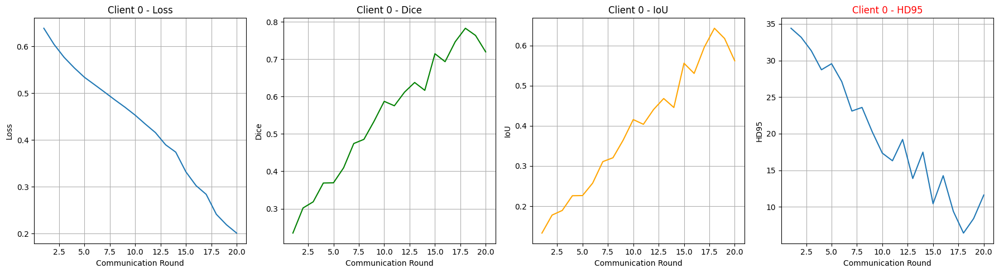

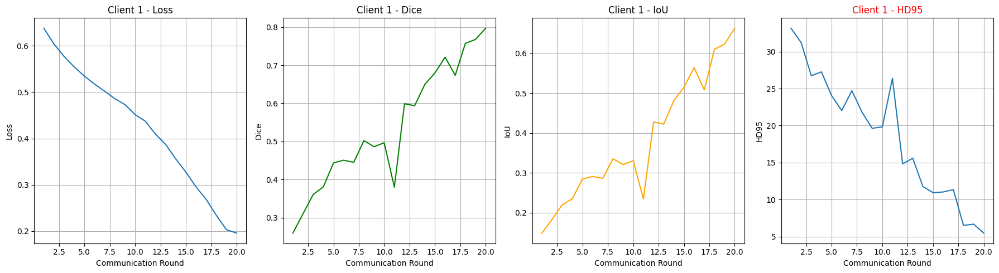

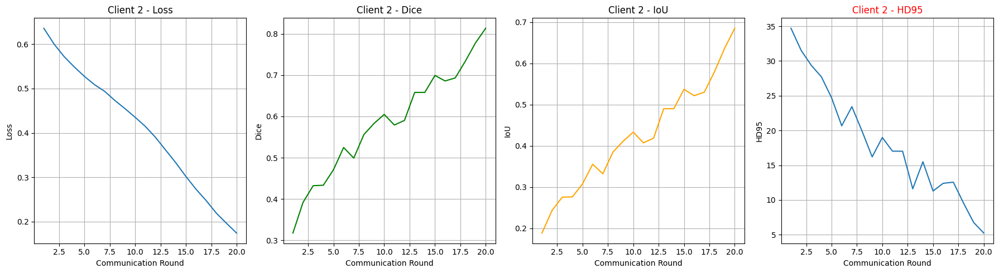

In [16]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"])
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95", color="red")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

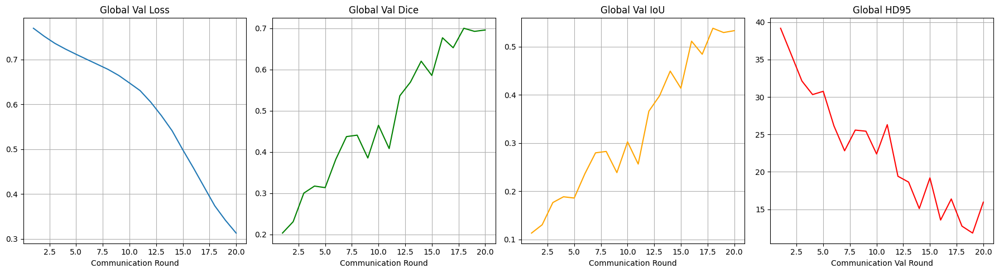

In [17]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [18]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  54%|█████▍    | 27/50 [00:16<00:13,  1.72it/s, Dice=0.6006, IoU=0.4292, HD95=11.9390]c:\Users\LAB\AppData\Local\Python\pythoncore-3.14-64\Lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:28<00:00,  1.76it/s, Dice=0.6652, IoU=0.4984, HD95=9.9268] 


Test Set Metrics:
Dice: 0.6652
IoU: 0.4984
HD95: 9.9268


**Visualize**

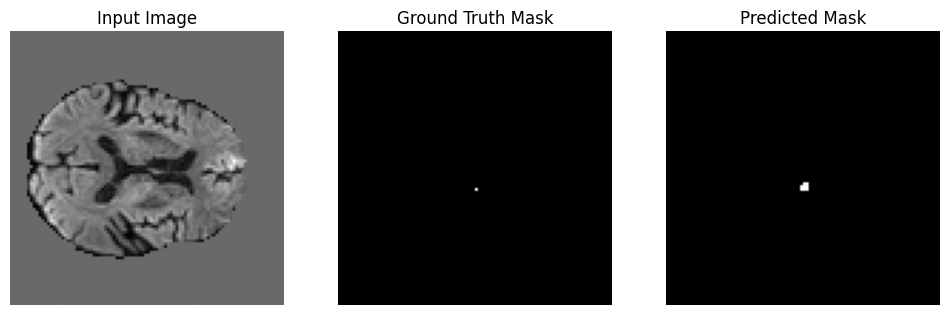

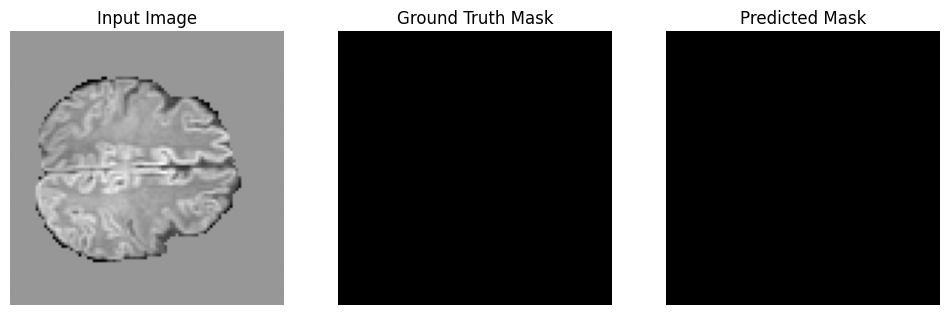

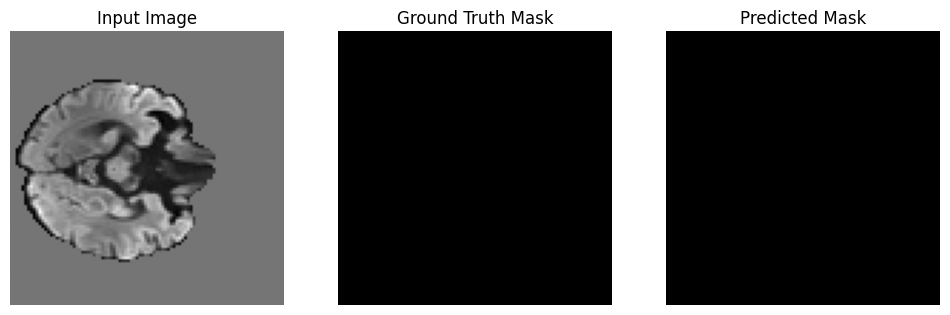

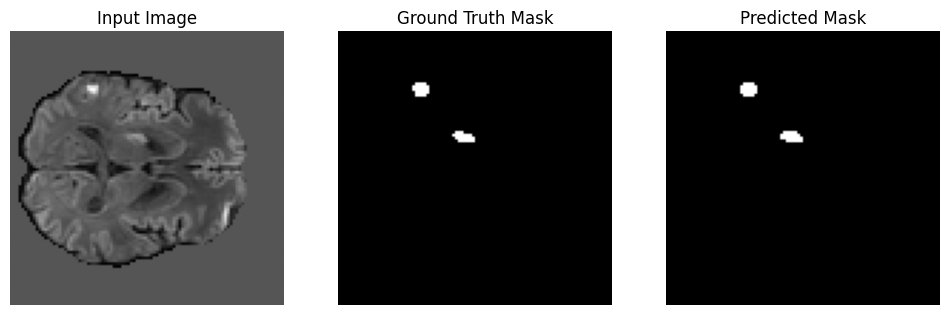

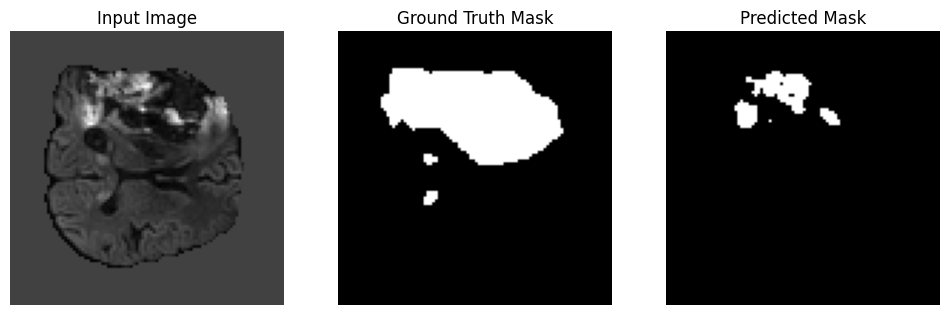

...

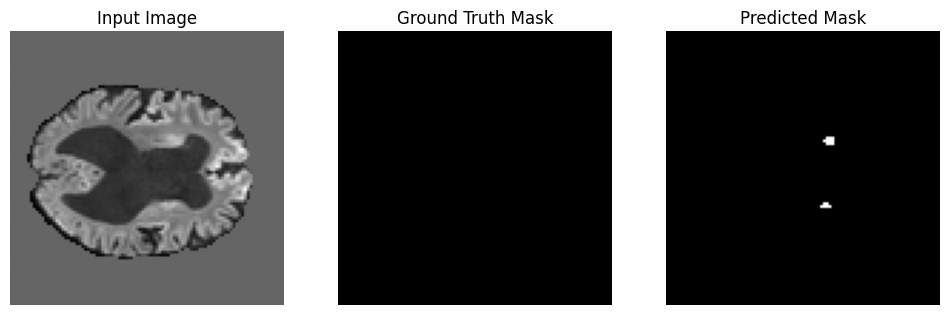

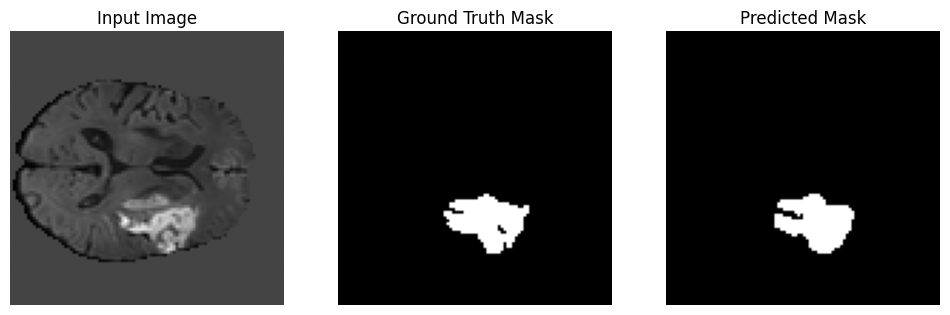

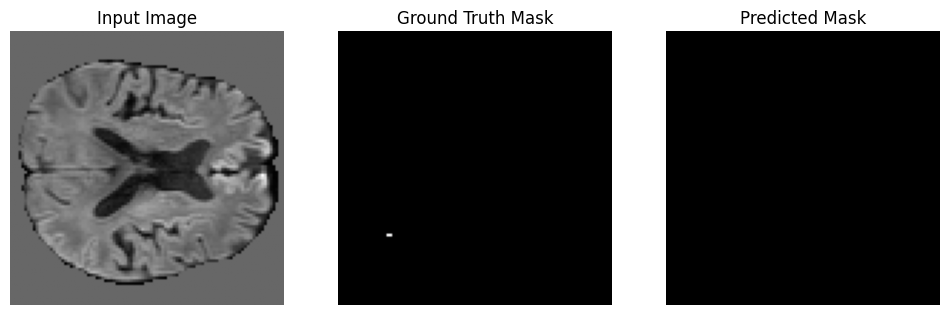

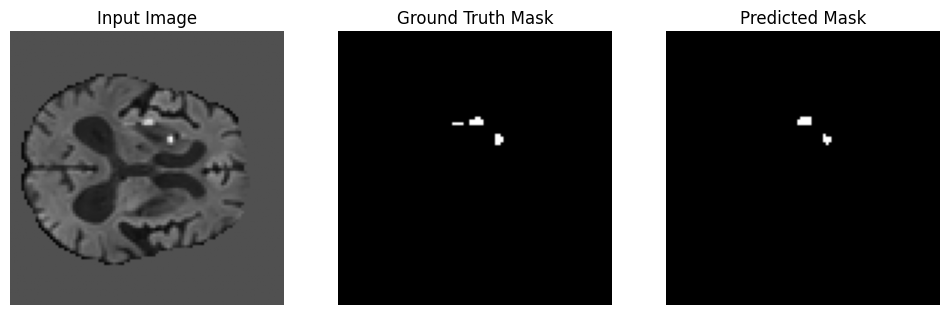

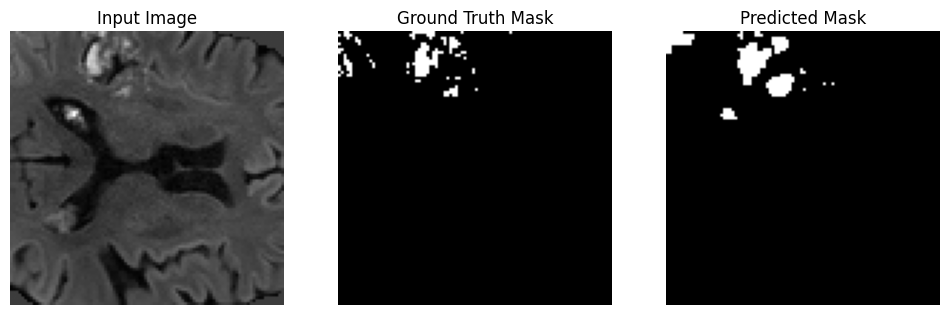

In [29]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()